# Validation of Three Rectangles algorithm

Compare parking labels assigned by Three Rectangles algorithm against the manually labelled set

## Libraries

In [1]:
import os
from os import path
import glob
import sys
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import pprint

%matplotlib inline
pd.set_option('display.max_column', 100) #set max number of cols to display before ...

#check correct environment is being used: parkprov
print(sys.executable)

import rasterio
from rasterio._base import gdal_version
#https://rasterio.readthedocs.io/en/latest/
import rasterio.warp
import rasterio.features
from rasterio import plot #essential to plot images in BNG, in correct position, and full RGB 
from rasterio.mask import mask

import folium
import fiona
import pyproj
import shapely as shp
from shapely.ops import linemerge
from shapely.ops import unary_union

/Users/tamsinforbes/anaconda3/envs/parkprov/bin/python


In [2]:
import warnings

## Read files

### Load tq1980_labels_2.csv
- manLab: tq1980_labels_2.csv includes final 'label' column with 1 = parking, 0 = no parking

In [3]:
manLab = pd.read_csv(
    "../validation/manual_labelling/tq1980_labels_2.csv"
    , dtype = {
        'GRID' : object
        , 'TOID' : object
        , 'label_tjf' : np.int32
        , 'label_others' : np.int32
        , 'label_review' : np.int32
        , 'tjf_vs_others' : bool
        , 'label' : np.int32

    }
)

In [4]:
manLab.head()

,GRID,TOID,label_tjf,label_others,label_review,tjf_vs_others,label
0,TQ1980,1000001778697865,1,1,1,True,1
1,TQ1980,1000001778701813,1,1,1,True,1
2,TQ1980,1000001778708189,3,3,3,True,0
3,TQ1980,1000001778701807,4,1,2,False,1
4,TQ1980,1000001778697871,1,1,1,True,1


In [5]:
manLab.dtypes

GRID             object
TOID             object
label_tjf         int32
label_others      int32
label_review      int32
tjf_vs_others      bool
label             int32
dtype: object

### Load Three Rectangles output: parking_recs_attempt_2

In [6]:
recs2 = pd.read_csv(
    "../parking_output/parking_recs_attempt_2.csv"
    , dtype = {
        'TOID' : object
        , 'geometry' : object
        , 'prop_of_rec' : np.float64
    }
)

#convert WKT strings to geometry
recs2['geometry'] = recs2['geometry'].map(shp.wkt.loads)
#convert to geodataframe and set CRS
recs2 = gpd.GeoDataFrame(recs2, crs="EPSG:27700", geometry="geometry")

In [7]:
recs2.shape

(3169, 3)

In [8]:
recs2.crs

<Projected CRS: EPSG:27700>
Name: OSGB 1936 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: UK - Britain and UKCS 49°46'N to 61°01'N, 7°33'W to 3°33'E
- bounds: (-9.2, 49.75, 2.88, 61.14)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: OSGB 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [9]:
recs2.head()
#contains TOID, polygon of rectangle overlap with manmade surface
#proportion of rectangle that fits on the manmade surface

,TOID,geometry,prop_of_rec
0,1000001778697829,"POLYGON ((519563.092 180927.500, 519565.000 18...",0.983936
1,1000001778697829,"POLYGON ((519564.612 180927.500, 519565.000 18...",1.067739
2,1000001778697829,"POLYGON ((519568.500 180927.887, 519568.500 18...",1.056203
3,1000001778697829,"POLYGON ((519573.000 180928.575, 519573.000 18...",1.014451
4,1000001778697829,"POLYGON ((519574.484 180929.000, 519575.000 18...",0.978213


In [11]:
recs2.describe()

,prop_of_rec
count,3169.000000
mean,0.861067
std,0.214898
min,0.018541
25%,0.730813
50%,0.918197
75%,1.051512
max,1.104666


### Load cropped gardens

In [23]:
#Load cropped gardens
#cg: cropped gardens
#read in as strings
cg = pd.read_csv("../data/cropped_gardens.csv"
                 , dtype={'gdnTOID': object, 'geometry': object})
#convert WKT strings to geometry
cg['geometry'] = cg['geometry'].map(shp.wkt.loads)
#convert to geodataframe and set CRS
cg = gpd.GeoDataFrame(cg, crs="EPSG:27700", geometry="geometry").rename(columns={"gdnTOID": "TOID"})

In [24]:
cg.nunique()

TOID        1329
geometry    1329
dtype: int64

In [25]:
#list of mpt: manually labelled parking TOIDs
mpt = manLab[ manLab['label'] == 1 ]['TOID'].drop_duplicates().tolist()

#add this column to cg
cg['manLab'] = ( cg['TOID'].apply(lambda x: 1 if x in mpt else 0 ) )

In [26]:
cg.head()

,TOID,geometry,manLab
0,0001000003513170,"POLYGON ((519327.150 180219.550, 519329.100 18...",1
1,1000001778258479,"POLYGON ((519684.949 180970.923, 519685.728 18...",1
2,1000001778258579,"POLYGON ((519666.761 180968.013, 519667.537 18...",1
3,1000001778258580,"POLYGON ((519693.713 180972.325, 519694.467 18...",1
4,1000001778258608,"POLYGON ((519712.133 180975.268, 519712.903 18...",1


### Load rasters

In [27]:
#load TQ1980 APGB grids
path_rgb1980 = "../data/APEaling_111706_20200601/25cm_Aerial_Photo/111706-1_RGB_1_Shape/TQ1980.tif"
path_irg1980 = "../data/APGB_Ealing_InfraRedImagery/111803_20200707/50cm Colour Infrared/111803-1_CIR_1_Shape/TQ1980.tif"

#open
irg1980 = rasterio.open(path_irg1980)
rgb1980 = rasterio.open(path_rgb1980)

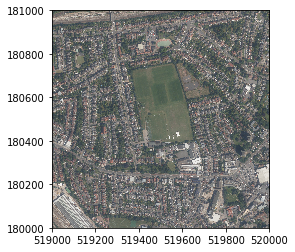

In [28]:
plot.show(rgb1980)

# Overall method accuracy analysis

This analysis looks at the entire method
- classing under sized areas as no parking
- classing areas without sufficient roadside access as no parking
- fitting rectanlges




## Look at accuracy cross tabs of thresholds 0.7, 0.8, 0.9, 1.0

I want to maximise the proportion of True positives/negative and minimise False positives/negatives. What if I get the True proportion for a range of thresholds and plot, there should be a peak.

In [117]:
thresholds = [0.7, 0.8, 0.9, 1.0]
crosstabs = []

for t in thresholds:
    r = recs2.copy(deep = True)
    c = cg.copy(deep = True)
    
    #create parking label from threshold
    r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )
    
    #create lists of parking rectangle labelled parking TOIDs from this threshold
    rpt = r[ r['parking'] == 1 ]['TOID'].drop_duplicates().tolist()
    #add column to c
    c['recLab'] = ( c['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )
    #append crosstab to list
    crosstabs.append(pd.crosstab(c['manLab'], c['recLab']) / cg.shape[0])

crosstabs

[recLab         0         1
 manLab                    
 0       0.239278  0.234763
 1       0.069225  0.456734,
 recLab         0         1
 manLab                    
 0       0.328819  0.145222
 1       0.075245  0.450715,
 recLab         0         1
 manLab                    
 0       0.401806  0.072235
 1       0.091046  0.434913,
 recLab         0         1
 manLab                    
 0       0.437923  0.036117
 1       0.126411  0.399549]

## Get proportion true and plot

In [118]:
def prop_true_plot(threshold_list):
    
    #init list to hold proportion accurate: True positives + True negatives
    prop_true = []
    
    for t in threshold_list:
        r = recs2.copy(deep = True)
        c = cg.copy(deep = True)
    
        #create parking label from threshold
        r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )
    
        #create lists of parking rectangle labelled parking TOIDs from this threshold
        rpt = r[ r['parking'] == 1 ]['TOID'].drop_duplicates().tolist()
        #add column to c
        c['recLab'] = ( c['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )
        #create crosstab
        x = pd.crosstab(c['manLab'], c['recLab'])
        #sum True values and append prop to prop_true
        prop_true.append(
            round( (x.values[1, 1] +  x.values[0,0]) / c.shape[0], ndigits = 5 )
        )
        
    #create df to plot
    df = pd.DataFrame( {'Proportion_threshold' : np.array(threshold_list).round(decimals = 2)
                     , 'Proportion_true' : prop_true} )
    
    #plot
    plot = df.plot.bar(x = 'Proportion_threshold', y = 'Proportion_true', color = '#008080'
        , title = 'Proportion of true labels for each threshold' )
    
    return plot, df

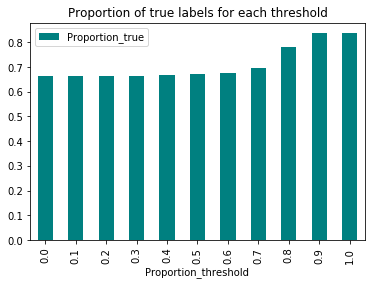

In [119]:
threshold_list = np.arange(0, 1.1, 0.1)
plot, df = prop_true_plot(threshold_list)

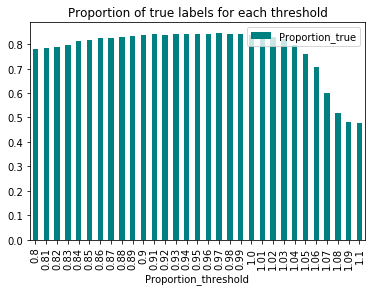

In [120]:
threshold_list = np.arange(0.8, 1.1, 0.01)
plot, df = prop_true_plot(threshold_list)

In [121]:
df.iloc[ df['Proportion_true'].argmax() ]

Proportion_threshold    0.97000
Proportion_true         0.84725
Name: 17, dtype: float64

## Use cut off threshold 0.97

The maximum true count occurs at threshold 0.97. This obviously minimises the number of false labels. The table below shows the gain/loss of individual TOIDs at each threshold in the neighbourhood of 0.97. We get an increase of +6 correctly labelled TOIDs at 0.97, and lose 8 at the next threshold. 

In [122]:
df84 = df[df['Proportion_true'] > 0.84]
df84['TOID_gain'] = ( 1329 * ( df.Proportion_true - df.Proportion_true.shift(1) ) ).round(0)
df84

,Proportion_threshold,Proportion_true,TOID_gain
13,0.93,0.84123,3.0
14,0.94,0.84123,0.0
15,0.95,0.84274,2.0
16,0.96,0.84274,0.0
17,0.97,0.84725,6.0
18,0.98,0.84123,-8.0
19,0.99,0.84048,-1.0


In [123]:
df84 = df[df['Proportion_true'] > 0.8]
df84['TOID_gain'] = ( 1329 * ( df.Proportion_true - df.Proportion_true.shift(1) ) ).round(0)
df84

,Proportion_threshold,Proportion_true,TOID_gain
4,0.84,0.81114,22.0
5,0.85,0.81866,10.0
6,0.86,0.82468,8.0
7,0.87,0.82619,2.0
8,0.88,0.82919,4.0
9,0.89,0.83220,4.0
10,0.90,0.83672,6.0
11,0.91,0.83973,4.0
12,0.92,0.83898,-1.0
13,0.93,0.84123,3.0


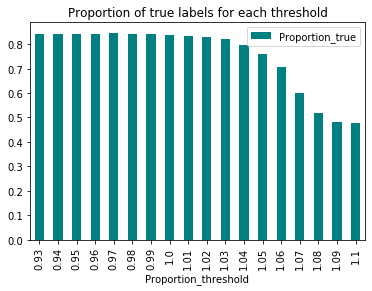

In [124]:
threshold_list = np.arange(0.93, 1.1, 0.01)
plot, df = prop_true_plot(threshold_list)

## "No parking" classification

The no parking classification had a few steps before the rectangle fitting

- too small: area less than 12.5 sqm (dropped 37)
- no access: no intersection with roadside edge (dropped 133)
- access too narrow: roadside intersection exists but is less than 2.4 m (dropped 188)

358 TOIDs were classed as no parking before we got to fitting the rectangles. Would be good to know which ones these were. possibly. 


## Plot images with parking threshold 0.97

- true positives: manLab = 1, recs2 = 1
- true negatives: manLab = 0, recs2 = 0
- false positive: manLab = 0, recs2 = 1
- false negative: manLab = 1, recs2 = 0

In [125]:
#add parking column to recs2
threshold = 0.97
recs2['parking'] = ( recs2['prop_of_rec'].apply(lambda x: 1 if x >= threshold else 0) )

#create lists of parking TOIDs
recs2_parking_toids = recs2[ recs2['parking'] == 1 ]['TOID'].drop_duplicates().tolist()
manLab_parking_toids = manLab[ manLab['label'] == 1 ]['TOID'].drop_duplicates().tolist()

print("manual labelling: number of gardens with parking potential: ", len(manLab_parking_toids))
print("rectangle fitting labelling with threshold", threshold
      , ": number of gardens with parking potential: ", len(recs2_parking_toids))

#add these columns to cg
cg['manLab'] = ( cg['TOID'].apply(lambda x: 1 if x in manLab_parking_toids else 0 ) )
cg['recLab'] = ( cg['TOID'].apply(lambda x: 1 if x in recs2_parking_toids else 0 ) )

manual labelling: number of gardens with parking potential:  699
rectangle fitting labelling with threshold 0.97 : number of gardens with parking potential:  606


In [139]:
acc = pd.crosstab(cg['manLab'], cg['recLab'], margins = True)
acc

recLab,0,1,All
manLab,,,
0,575,55,630
1,148,551,699
All,723,606,1329


In [138]:
acc_norm = pd.crosstab(cg['manLab'], cg['recLab'], margins = True, normalize=True)
acc_norm

recLab,0,1,All
manLab,,,
0,0.432656,0.041384,0.474041
1,0.111362,0.414597,0.525959
All,0.544018,0.455982,1.000000


In [127]:
acc = pd.crosstab(cg['manLab'], cg['recLab'], margins = True, normalize=True)
acc

recLab,0,1,All
manLab,,,
0,0.432656,0.041384,0.474041
1,0.111362,0.414597,0.525959
All,0.544018,0.455982,1.000000


In [128]:
148+551


699

In [140]:
print("Accuracy"
      , "\nProportion accurate: "
      , round( (acc.values[1, 1] +  acc.values[0,0]) / cg.shape[0], ndigits = 2 )
      , "\nTrue positive: "
      , round(acc.values[1, 1] / cg.shape[0], ndigits = 2)
      , "\nTrue negatives: "
      , round( acc.values[0,0] / cg.shape[0], ndigits = 2 )
      , "\nFalse positives: "
      , round( acc.values[0,1]  / cg.shape[0], ndigits = 2 )
      , "\nFalse negatives: "
      , round( acc.values[1,0]  / cg.shape[0], ndigits = 2 )
     )

Accuracy 
Proportion accurate:  0.85 
True positive:  0.41 
True negatives:  0.43 
False positives:  0.04 
False negatives:  0.11


## Plot true/false positives/negatives

False negatives are where the algorithm labelled the TOID as no parking (0) but the manual labelling labelled it as parking potential (1).

I think I care slightly more about false negatives as these are potential parking spaces that the algorithm has failed to count. Would be good to understand why.

But as it is it looks like the Three Rectangle fitting algorithm (combined with the first steps of discounting TOIDs if vms is too small, not intersecting the roadside, or the roadside intersection is too narrow) will underestimate the parking, when compared to the manual labels, as it predicts more false negatives (11%) than false positives (4%), by just over double in this test.

In [150]:
#Function to plot this same plot and allow zooming by setting xlim and ylim, zoom is bad name
#tfpn_zoom? true/false/positive/negative

def zoom( xmin = 519000
         , xmax = 520000
         , ymin = 180000
         , ymax = 181000 ): #all ints
    
    warnings.filterwarnings("ignore")
    
    base = cg[cg['recLab'] == 1][cg['manLab'] == 1].plot(
        figsize=(20, 20), color = 'green', edgecolor = 'black', alpha = 0.3) #true pos
    cg[cg['recLab'] == 0][cg['manLab'] == 0].plot(
        ax = base, color = 'yellow', edgecolor = 'black', alpha = 0.3) #true neg
    cg[cg['recLab'] == 1][cg['manLab'] == 0].plot(
        ax = base, color = 'red', edgecolor = 'black', alpha = 0.3) #false pos
    cg[cg['recLab'] == 0][cg['manLab'] == 1].plot(
        ax = base, color = 'purple', edgecolor = 'black', alpha = 0.3) #false neg
    
    recs2.plot(ax = base, color = 'cyan', edgecolor = 'grey', linewidth = 1, alpha = 0.4)
    

    rasterio.plot.show(rgb1980, ax = base, alpha = 1)
    base.set_title("True Positive: green, True Negative: yellow," +
                   "\nFalse Positive: red, False Negative: purple")
    base.set_xlim(xmin, xmax)
    base.set_ylim(ymin, ymax)
    

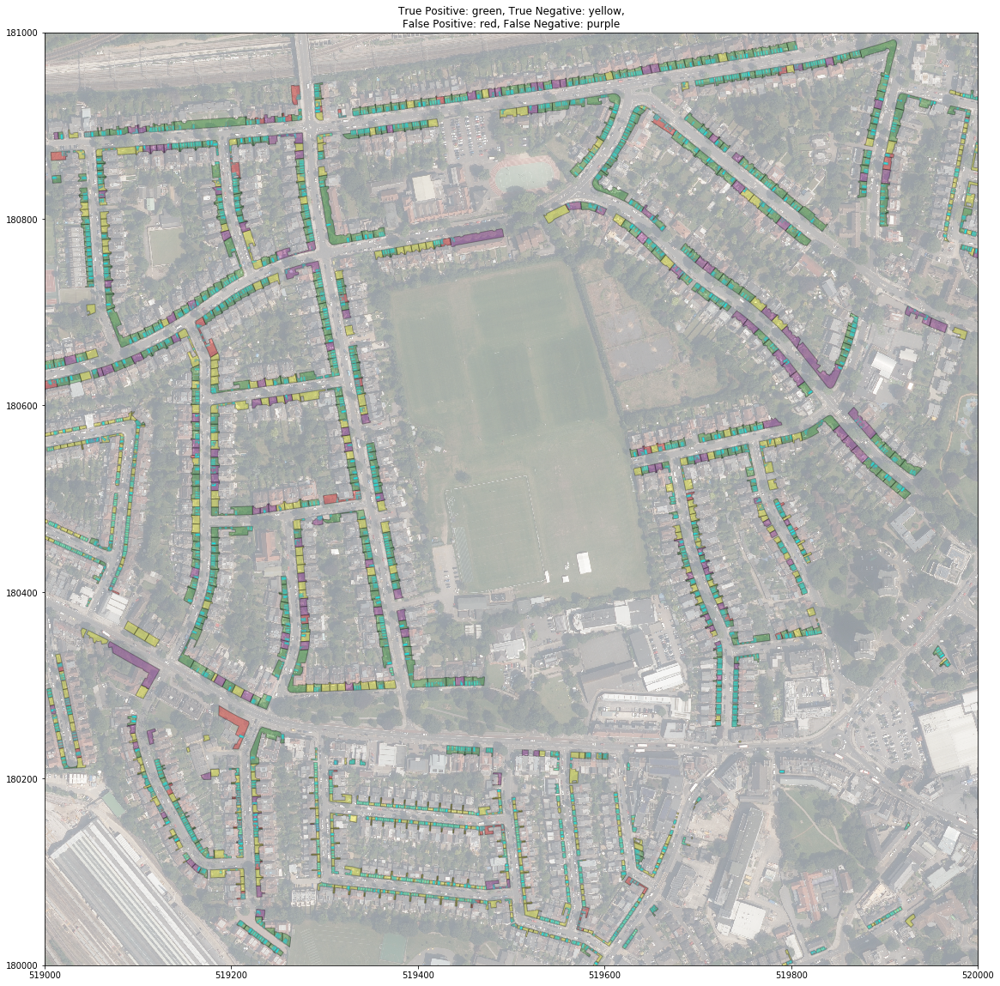

In [142]:
zoom()

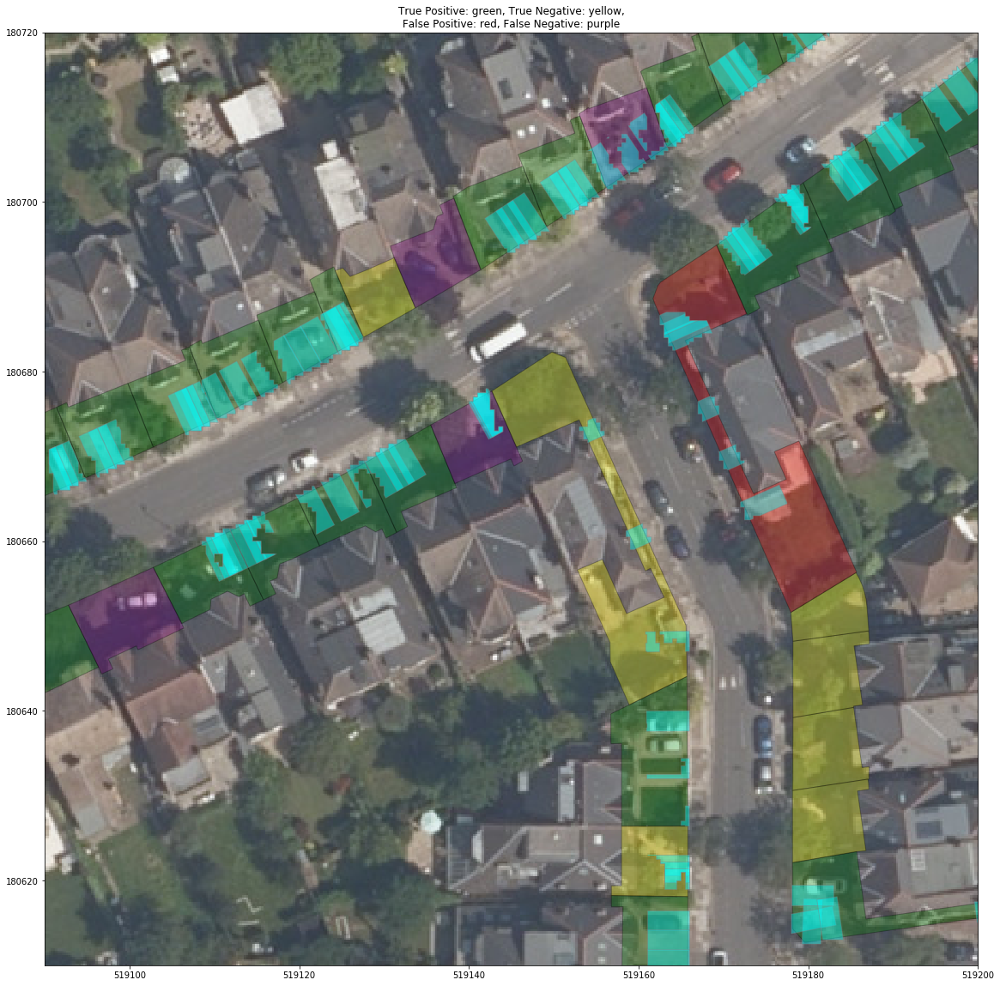

In [162]:
zoom(519090, 519200, 180610, 180720)

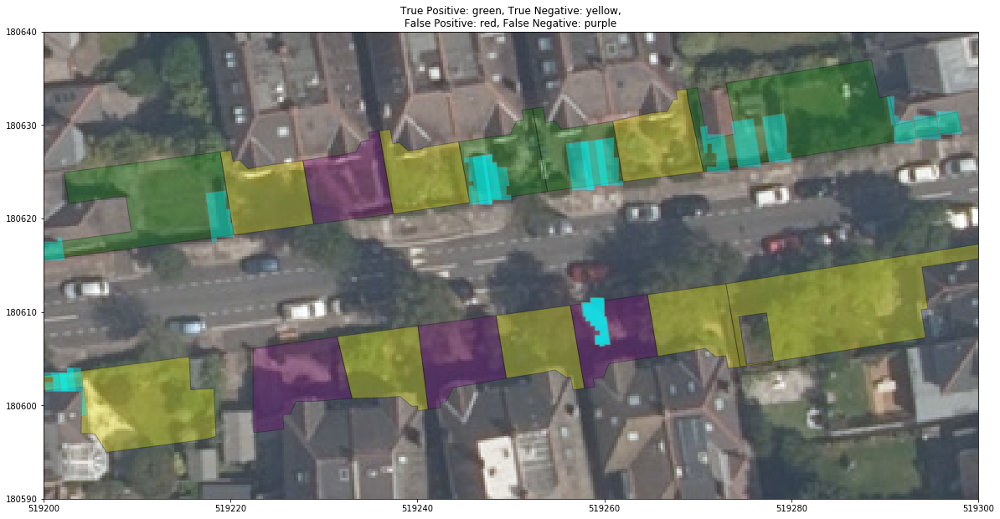

In [151]:
zoom(519200, 519300, 180590, 180640)

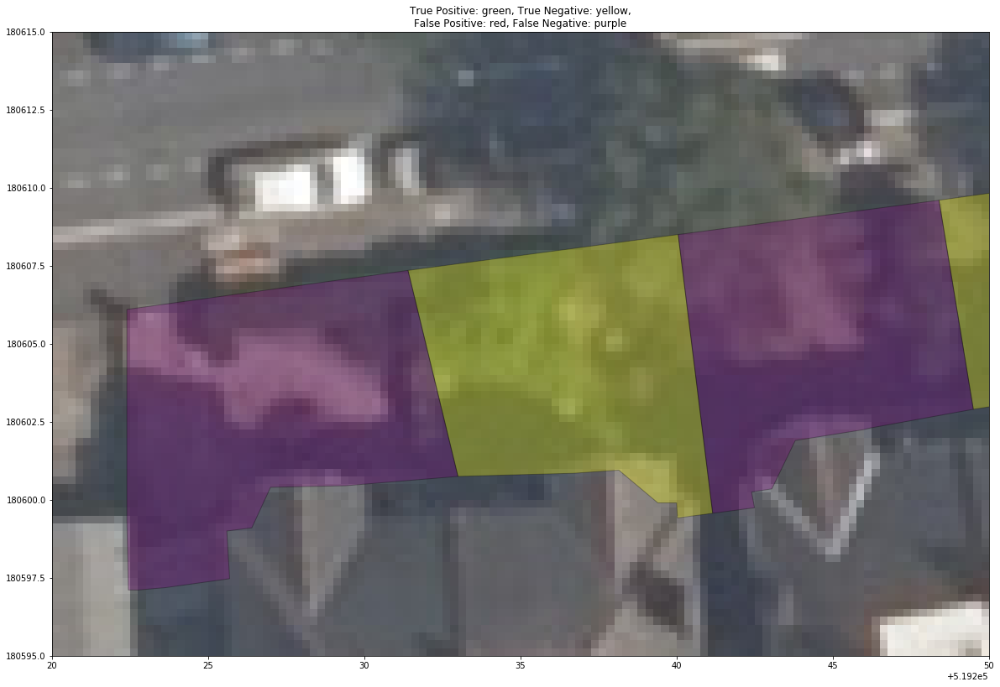

In [156]:
zoom(519220, 519250, 180595, 180615)

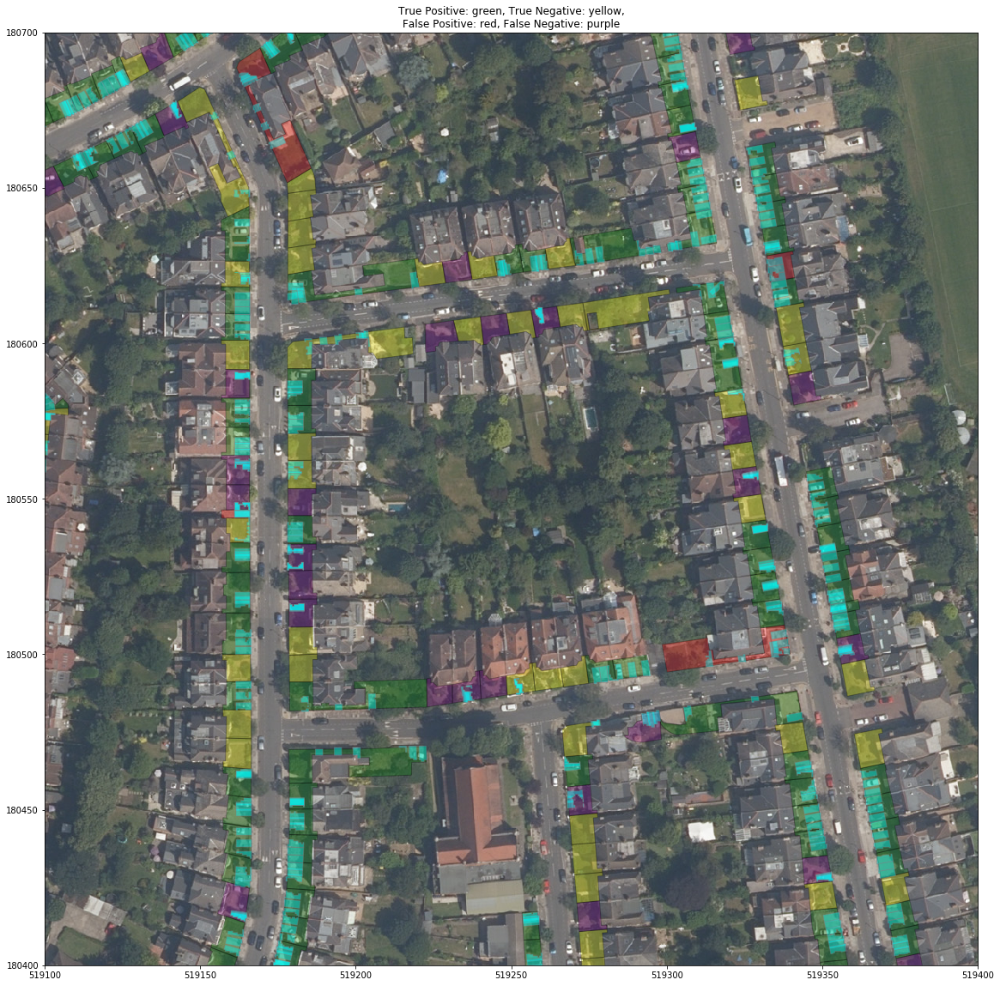

In [157]:
zoom(519100, 519400, 180400, 180700)

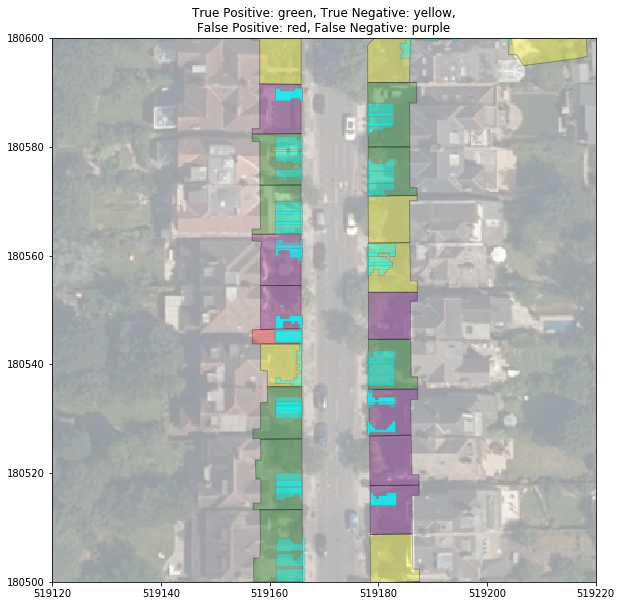

In [49]:
zoom(519120, 519220, 180500, 180600)

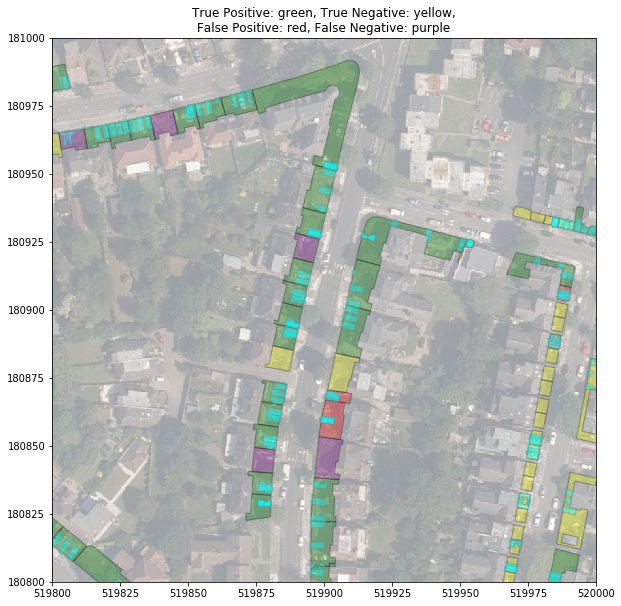

In [50]:
zoom(519800, 520000, 180800, 181000)

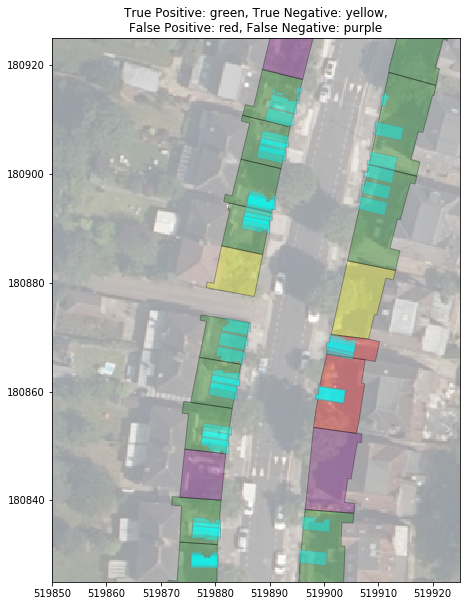

In [51]:
zoom(519850, 519925, 180825, 180925)

(180800, 180900)

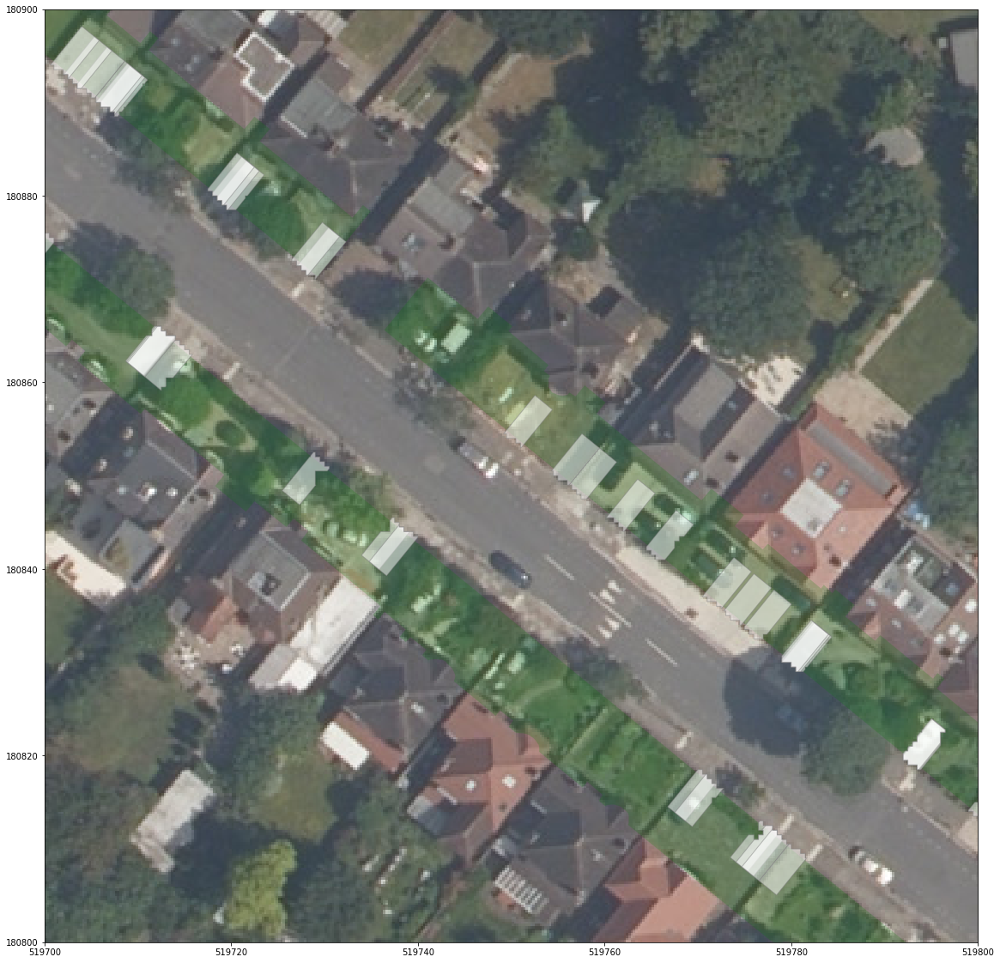

In [175]:
base = cg.plot(figsize = (20,20), color = 'green', alpha = 0.2)
recs2[ recs2['parking'] == 1 ].plot(ax = base, color = 'white', edgecolor = 'grey', alpha = 0.5)
plot.show(rgb1980, ax = base)
base.set_xlim(519700, 519800)
base.set_ylim(180800, 180900)

## Look at False negatives in more detail

Plot individual

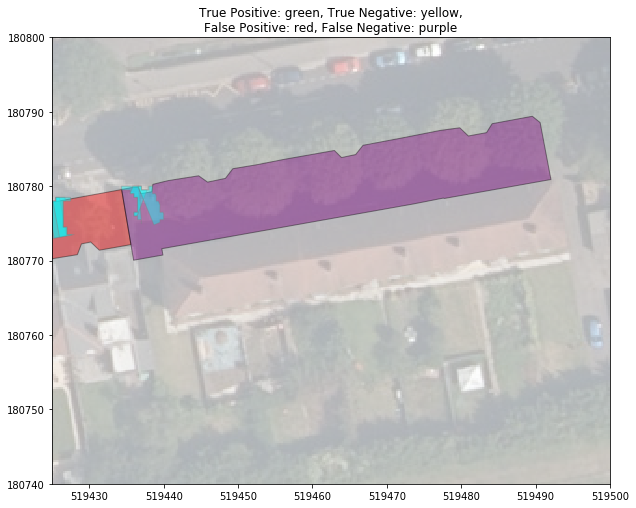

In [43]:
zoom(519425, 519500, 180740, 180800)
#This is just one garden, covered by tree canopy and the 'drive' might actually be just a path

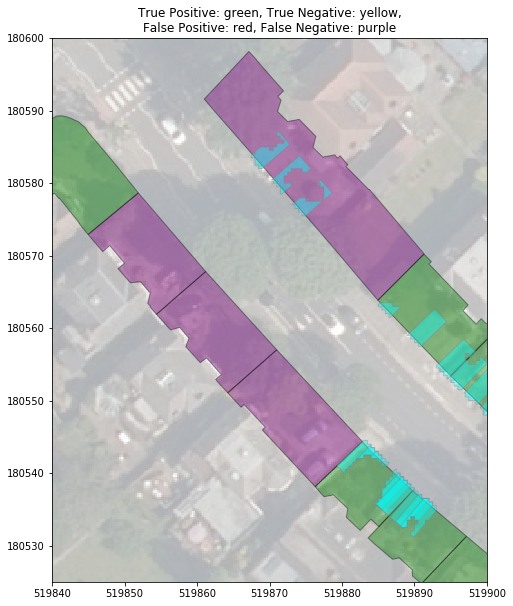

In [44]:
zoom(519840, 519900, 180525, 180600)

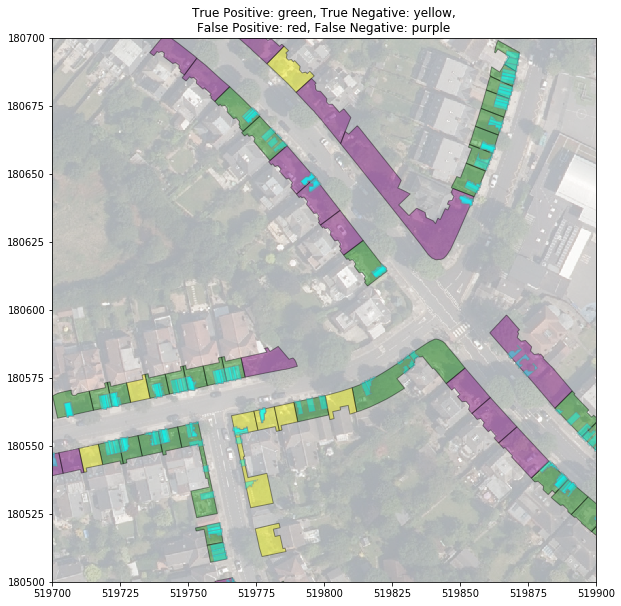

In [45]:
zoom(519700, 519900, 180500, 180700)

In [ ]:
zoom()

## Proportion overlap greater than 1

In [12]:
recs2.describe()

,prop_of_rec
count,3169.000000
mean,0.861067
std,0.214898
min,0.018541
25%,0.730813
50%,0.918197
75%,1.051512
max,1.104666


In [20]:
recs2.prop_of_rec.value_counts()

1.041667    5
1.041667    3
0.732315    3
0.738690    2
0.739624    2
           ..
1.071033    1
0.890701    1
1.058787    1
1.008784    1
0.923612    1
Name: prop_of_rec, Length: 3150, dtype: int64

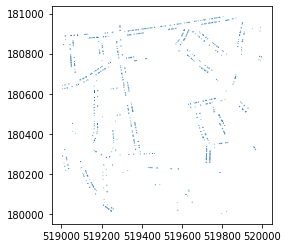

In [22]:
recs2[recs2['prop_of_rec']>1].plot()

# Analysis of just the rectangle fitting algorithm

On 971 rectangles, after 354 have already been classed as having too small area or too narrow/zero roadside edge

## Look at just the 971 TOIDs that had rectangles fitted

In [53]:
t = 0.97

In [54]:
toids_in_recs = recs2['TOID'].drop_duplicates().tolist()


In [90]:
r = recs2.copy(deep = True)
c = cg.copy(deep = True)

#subset cg for just toids used in rectangle fitting
c = cg[cg['TOID'].isin(toids_in_recs)].reset_index(drop=True)

In [91]:
c.head()

,TOID,geometry,manLab
0,0001000003513170,"POLYGON ((519327.150 180219.550, 519329.100 18...",1
1,1000001778258479,"POLYGON ((519684.949 180970.923, 519685.728 18...",1
2,1000001778258579,"POLYGON ((519666.761 180968.013, 519667.537 18...",1
3,1000001778258580,"POLYGON ((519693.713 180972.325, 519694.467 18...",1
4,1000001778258608,"POLYGON ((519712.133 180975.268, 519712.903 18...",1


In [56]:
r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )

In [57]:
r.head()

,TOID,geometry,prop_of_rec,parking
0,1000001778697829,"POLYGON ((519563.092 180927.500, 519565.000 18...",0.983936,1
1,1000001778697829,"POLYGON ((519564.612 180927.500, 519565.000 18...",1.067739,1
2,1000001778697829,"POLYGON ((519568.500 180927.887, 519568.500 18...",1.056203,1
3,1000001778697829,"POLYGON ((519573.000 180928.575, 519573.000 18...",1.014451,1
4,1000001778697829,"POLYGON ((519574.484 180929.000, 519575.000 18...",0.978213,1


In [58]:
r.shape

(3169, 4)

In [59]:
rpt = r[ r['parking'] == 1 ]['TOID'].drop_duplicates().tolist()


In [60]:
len(rpt) #number of toids labelled parking by algorithm 

606

In [61]:
c['recLab'] = ( c['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )


<ipython-input-61-2eeba5bcfbe9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c['recLab'] = ( c['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )


In [62]:
c.head()

,TOID,geometry,manLab,recLab
0,0001000003513170,"POLYGON ((519327.150 180219.550, 519329.100 18...",1,1
1,1000001778258479,"POLYGON ((519684.949 180970.923, 519685.728 18...",1,1
2,1000001778258579,"POLYGON ((519666.761 180968.013, 519667.537 18...",1,1
3,1000001778258580,"POLYGON ((519693.713 180972.325, 519694.467 18...",1,1
4,1000001778258608,"POLYGON ((519712.133 180975.268, 519712.903 18...",1,1


In [66]:
x = pd.crosstab(c['manLab'], c['recLab'], margins=True)

In [67]:
x

recLab,0,1,All
manLab,,,
0,304,55,359
1,61,551,612
All,365,606,971


In [69]:
pd.crosstab(c['manLab'], c['recLab'], margins=True, normalize=True)

recLab,0,1,All
manLab,,,
0,0.313079,0.056643,0.369722
1,0.062822,0.567456,0.630278
All,0.375901,0.624099,1.000000


In [65]:
round( (x.values[1, 1] +  x.values[0,0]) / c.shape[0], ndigits = 5 )

0.88054

In [77]:
x.values[1, 1]

551

In [79]:
x.values[1,1]

551

In [80]:
prop_true = []
prop_true.append(
            round( (x.values[1, 1] +  x.values[0,0]) / c.shape[0], ndigits = 5 )
        )
prop_true.append(
            round( (x.values[1, 1] +  x.values[0,0]) / c.shape[0], ndigits = 5 )
        )

prop_true


[0.88054, 0.88054]

In [84]:
recs2.head()

,TOID,geometry,prop_of_rec
0,1000001778697829,"POLYGON ((519563.092 180927.500, 519565.000 18...",0.983936
1,1000001778697829,"POLYGON ((519564.612 180927.500, 519565.000 18...",1.067739
2,1000001778697829,"POLYGON ((519568.500 180927.887, 519568.500 18...",1.056203
3,1000001778697829,"POLYGON ((519573.000 180928.575, 519573.000 18...",1.014451
4,1000001778697829,"POLYGON ((519574.484 180929.000, 519575.000 18...",0.978213


In [106]:
def recs_prop_true_plot(threshold_list):
    
    #init list to hold proportion accurate: True positives + True negatives
    prop_true = []
    
    for t in threshold_list:
        
        #get list of toids used in the rectangle fitting
        toids_in_recs = recs2['TOID'].drop_duplicates().tolist() #971 TOIDs
        
        r = recs2.copy(deep = True)
        c = cg.copy(deep = True)
        #subset cg for just toids used in rectangle fitting
        c = c[c['TOID'].isin(toids_in_recs)].reset_index(drop=True)
    
        #create parking label from threshold
        r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )
    
        #create lists of parking rectangle labelled parking TOIDs from this threshold
        rpt = r[ r['parking'] == 1 ]['TOID'].drop_duplicates().tolist()
        #add column to c
        c['recLab'] = ( c['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )
        #create crosstab
        x = pd.crosstab(c['manLab'], c['recLab'])
        #sum True values and append prop to prop_true
        prop_true.append(
            round( (x.values[1, 1] +  x.values[0,0]) / c.shape[0], ndigits = 5 )
        )
        
    #create df to plot
    df = pd.DataFrame( {'Proportion_threshold' : np.array(threshold_list).round(decimals = 2)
                     , 'Proportion_true' : prop_true} )
    
    #plot
    plot = df.plot.bar(x = 'Proportion_threshold', y = 'Proportion_true', color = '#008080'
        , title = 'Proportion of true labels for each threshold' )
    
    return plot, df

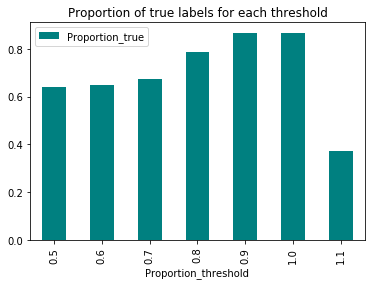

In [109]:
threshold_list = np.arange(0.5, 1.1, 0.1)
threshold_list

plot, df = recs_prop_true_plot(threshold_list)

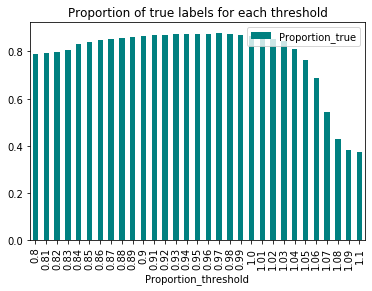

In [110]:
threshold_list = np.arange(0.8, 1.1, 0.01)
threshold_list

plot, df = recs_prop_true_plot(threshold_list)

In [114]:
df84 = df[df['Proportion_true'] > 0.86]
df84['TOID_gain'] = ( 971 * ( df.Proportion_true - df.Proportion_true.shift(1) ) ).round(0)
df84

<ipython-input-114-f58ed8f50b20>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df84['TOID_gain'] = ( 971 * ( df.Proportion_true - df.Proportion_true.shift(1) ) ).round(0)


,Proportion_threshold,Proportion_true,TOID_gain
10,0.90,0.86612,6.0
11,0.91,0.87024,4.0
12,0.92,0.86921,-1.0
13,0.93,0.87230,3.0
14,0.94,0.87230,0.0
15,0.95,0.87436,2.0
16,0.96,0.87436,0.0
17,0.97,0.88054,6.0
18,0.98,0.87230,-8.0
19,0.99,0.87127,-1.0


In [112]:
df.describe()

,Proportion_threshold,Proportion_true
count,31.000000,31.000000
mean,0.950000,0.787317
std,0.090921,0.147687
min,0.800000,0.371780
25%,0.875000,0.795060
50%,0.950000,0.851700
75%,1.025000,0.869725
max,1.100000,0.880540


In [36]:
toids_in_recs = recs2['TOID'].drop_duplicates().tolist()

In [40]:
c[c['TOID'].isin(toids_in_recs)]

,TOID,geometry,manLab
0,0001000003513170,"POLYGON ((519327.150 180219.550, 519329.100 18...",1
1,1000001778258479,"POLYGON ((519684.949 180970.923, 519685.728 18...",1
2,1000001778258579,"POLYGON ((519666.761 180968.013, 519667.537 18...",1
3,1000001778258580,"POLYGON ((519693.713 180972.325, 519694.467 18...",1
4,1000001778258608,"POLYGON ((519712.133 180975.268, 519712.903 18...",1
...,...,...,...
1321,5000005254709492,"POLYGON ((519607.600 180899.200, 519603.600 18...",1
1323,5000005254709497,"POLYGON ((519340.777 180630.743, 519340.959 18...",1
1326,5000005254709546,"POLYGON ((519803.437 180779.385, 519795.966 18...",1
1327,5000005254709547,"POLYGON ((519861.008 180686.209, 519861.663 18...",1


In [38]:
len(toids_in_recs)

971

In [ ]:
r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )


# Compare VMs and rsls to rectangles

In [163]:
dhvms = pd.read_csv(
    "../data/dhvms.csv"
    , dtype={'TOID': object, 'geometry': object})
#### convert WKT strings to geometry
dhvms['geometry'] = dhvms['geometry'].map(shp.wkt.loads)
#### convert to geodataframe and set CRS
dhvms = gpd.GeoDataFrame(dhvms, crs="EPSG:27700", geometry="geometry")

In [170]:
vms_orig = pd.read_csv(
    "../data/vms_original.csv"
    , dtype={'TOID': object, 'geometry': object})
#### convert WKT strings to geometry
vms_orig['geometry'] = vms_orig['geometry'].map(shp.wkt.loads)
#### convert to geodataframe and set CRS
vms_orig = gpd.GeoDataFrame(vms_orig, crs="EPSG:27700", geometry="geometry")

In [174]:
vms_orig.nunique()

geometry    2621
TOID        1327
dtype: int64

In [164]:
rsls = pd.read_csv(
    "../data/rsls24.csv"
    , dtype={'TOID': object, 'geometry': object, 'rslsLength': np.float64})
#### convert WKT strings to geometry
rsls['geometry'] = rsls['geometry'].map(shp.wkt.loads)
#### convert to geodataframe and set CRS
rsls = gpd.GeoDataFrame(rsls, crs="EPSG:27700", geometry="geometry")

In [165]:
dhvms.head()

,TOID,geometry
0,0001000003513170,"POLYGON ((519329.000 180221.500, 519329.000 18..."
1,1000001778258479,"POLYGON ((519691.000 180972.500, 519691.000 18..."
2,1000001778258579,"POLYGON ((519675.500 180970.000, 519675.500 18..."
3,1000001778258580,"POLYGON ((519700.500 180974.000, 519700.500 18..."
4,1000001778258608,"POLYGON ((519717.500 180976.500, 519717.500 18..."


In [168]:
dhvms.nunique()

TOID        971
geometry    971
dtype: int64

In [166]:
rsls.head()

,TOID,geometry,rslsLength
0,1000001778697829,"LINESTRING (519563.150 180927.100, 519566.950 ...",5.407596
1,1000001778697829,"LINESTRING (519573.000 180928.575, 519578.400 ...",5.462707
2,5000005138038971,"LINESTRING (519676.600 180894.800, 519687.900 ...",14.634890
3,1000001778697815,"LINESTRING (519607.400 180867.900, 519610.000 ...",4.789100
4,1000001778697815,"LINESTRING (519610.051 180872.000, 519610.600 ...",5.994367


In [167]:
recs2.head()

,TOID,geometry,prop_of_rec,parking
0,1000001778697829,"POLYGON ((519563.092 180927.500, 519565.000 18...",0.983936,1
1,1000001778697829,"POLYGON ((519564.612 180927.500, 519565.000 18...",1.067739,1
2,1000001778697829,"POLYGON ((519568.500 180927.887, 519568.500 18...",1.056203,1
3,1000001778697829,"POLYGON ((519573.000 180928.575, 519573.000 18...",1.014451,1
4,1000001778697829,"POLYGON ((519574.484 180929.000, 519575.000 18...",0.978213,1


In [169]:
cg.shape

(1329, 4)

In [175]:
#add manLab to vms_orig
#list of mpt: manually labelled parking TOIDs
mpt = manLab[ manLab['label'] == 1 ]['TOID'].drop_duplicates().tolist()

#add this column to cg
vms_orig['manLab'] = ( vms_orig['TOID'].apply(lambda x: 1 if x in mpt else 0 ) )

In [176]:
vms_orig.head()

,geometry,TOID,manLab
0,"POLYGON ((519575.500 180929.500, 519575.500 18...",1000001778697829,1
1,"POLYGON ((519676.500 180895.000, 519676.500 18...",5000005138038971,1
2,"POLYGON ((519610.000 180872.000, 519609.500 18...",1000001778697815,1
3,"POLYGON ((519075.000 180506.000, 519075.000 18...",1000001778701863,0
4,"POLYGON ((519092.500 180526.500, 519092.500 18...",1000001778701877,0


In [177]:
#add reclab to vms_orih for threshold = 0.97
t = 0.97

#create parking label from threshold
r = recs2.copy(deep = True)
r['parking'] = ( r['prop_of_rec'].apply(lambda x: 1 if x >= t else 0) )

#create lists of parking rectangle labelled parking TOIDs from this threshold
rpt = r[ r['parking'] == 1 ]['TOID'].drop_duplicates().tolist()
#add column to c
vms_orig['recLab'] = ( vms_orig['TOID'].apply(lambda x: 1 if x in rpt else 0 ) )


In [178]:
vms_orig.head()

,geometry,TOID,manLab,recLab
0,"POLYGON ((519575.500 180929.500, 519575.500 18...",1000001778697829,1,1
1,"POLYGON ((519676.500 180895.000, 519676.500 18...",5000005138038971,1,1
2,"POLYGON ((519610.000 180872.000, 519609.500 18...",1000001778697815,1,1
3,"POLYGON ((519075.000 180506.000, 519075.000 18...",1000001778701863,0,0
4,"POLYGON ((519092.500 180526.500, 519092.500 18...",1000001778701877,0,0


In [186]:
#Function to plot this same plot and allow zooming by setting xlim and ylim, zoom is bad name
#tfpn_zoom? true/false/positive/negative

def vms_zoom( xmin = 519000
             , xmax = 520000
             , ymin = 180000
             , ymax = 181000 ): #all ints
    
    warnings.filterwarnings("ignore")
    
    base = vms_orig[vms_orig['recLab'] == 1][vms_orig['manLab'] == 1].plot(
        figsize=(20, 20), color = 'green', edgecolor = 'black', alpha = 0.5) #true pos
    vms_orig[vms_orig['recLab'] == 0][vms_orig['manLab'] == 0].plot(
        ax = base, color = 'yellow', edgecolor = 'black', alpha = 0.5) #true neg
    vms_orig[vms_orig['recLab'] == 1][vms_orig['manLab'] == 0].plot(
        ax = base, color = 'red', edgecolor = 'black', alpha = 0.5) #false pos
    vms_orig[vms_orig['recLab'] == 0][vms_orig['manLab'] == 1].plot(
        ax = base, color = 'purple', edgecolor = 'black', alpha = 0.5) #false neg
    
    recs2.plot(ax = base, color = 'cyan', edgecolor = 'grey', linewidth = 1, alpha = 0.6)
    rsls.plot(ax = base, color = 'white', linewidth = 1)

    rasterio.plot.show(rgb1980, ax = base, alpha = 1)
    base.set_title("True Positive: green, True Negative: yellow," +
                   "\nFalse Positive: red, False Negative: purple")
    base.set_xlim(xmin, xmax)
    base.set_ylim(ymin, ymax)
    

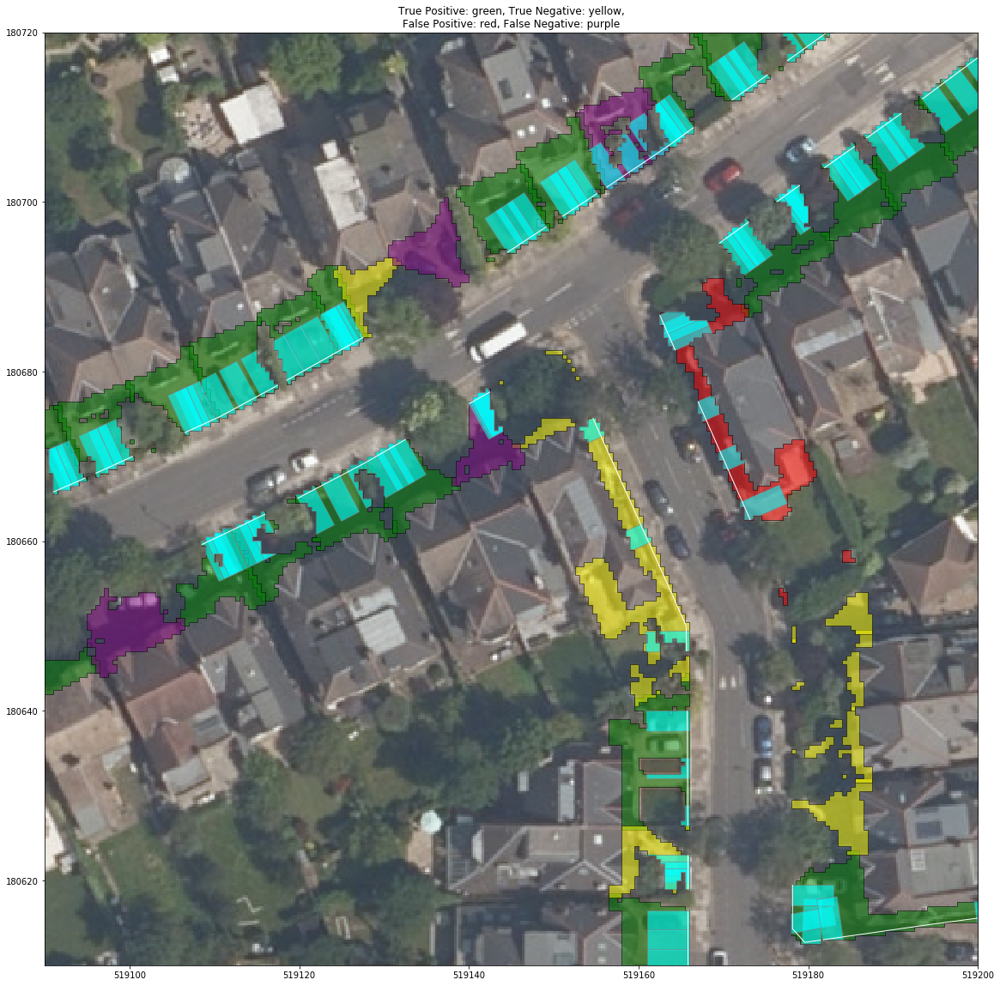

In [187]:
vms_zoom(519090, 519200, 180610, 180720)

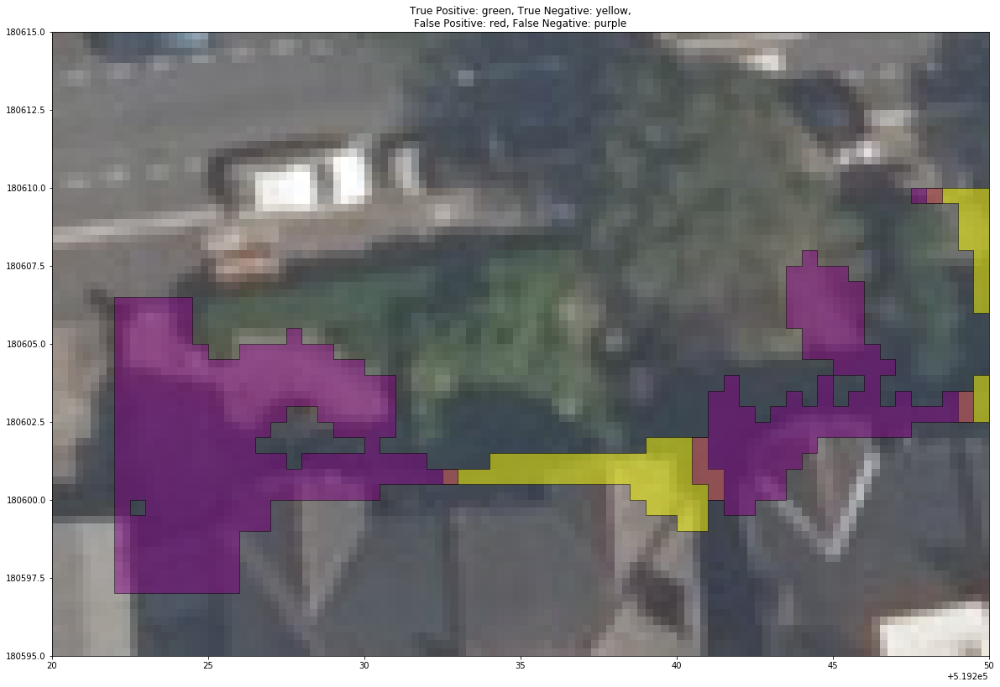

In [188]:
vms_zoom(519220, 519250, 180595, 180615)

# ARCHIVE

### Assuming manual labels are accurate

What percentage agreement do we have? using sets 

In [ ]:
print("percentage agreement: "
      , 100 * ( 1 - (len( set(recs2_parking_toids) - set(manLab_parking_toids) ) 
                     / len(manLab_parking_toids) ) )
      , "%"
     )